In [1]:
import torch
import numpy as np
from scipy.integrate import quad
import matplotlib.pyplot as plt

# Placeholder function for velocity v(Z_t, t)
def compute_velocity(z_t, z_t_minus_1, delta_t):
    v_t = (z_t_minus_1 - z_t) / delta_t
    return v_t

def straightness_measurement(Z_t_list, compute_velocity):
    """
    Measure the straightness of a trajectory given initial and final positions (Z_0, Z_1)
    and a velocity function v(Z_t, t).
    """

    Z_0 = Z_t_list[0]
    Z_1 = Z_t_list[-1]

    def integrand(t):
        # t is [0, 1], we must scale it to the length of Z_t_list
        i = t * (len(Z_t_list) - 1)
        delta_t = 1 / len(Z_t_list) # for now we assume linearly spaced time steps
        if t == 0:
            v_t = 0
        else:
            v_t = compute_velocity(Z_t_list[int(i)], Z_t_list[int(i-1)], delta_t)
        deviation = (Z_1 - Z_0) - v_t
        return np.mean(deviation ** 2)

    # Integrate from t=0 to t=1
    S_Z, _ = np.log(quad(integrand, 0, 1))
    return S_Z

def plot_straightness(Z_list_DiT, Z_list_SiT):
    models = ["DiT", "SiT"]
    straightness_values = [
        straightness_measurement(Z_list_DiT, compute_velocity),
        straightness_measurement(Z_list_SiT, compute_velocity)
    ]

    # Plotting straightness S(Z)
    plt.figure(figsize=(8, 5))
    plt.subplot(1, 3, 1)
    plt.plot(models, straightness_values, 'o--', color='blue', linewidth=2, markersize=10)
    plt.ylabel('log S(Z)')
    plt.grid(False)

    # Plotting trajectories of randomly sampled pixels for each model separately
    time = np.linspace(0, 1, Z_list_DiT.shape[0])
    num_trajectories = 10

    # pick 30 random pixels from the data
    random_indices_x = np.random.choice(Z_list_DiT.shape[-1], num_trajectories)
    random_indices_y = np.random.choice(Z_list_DiT.shape[-1], num_trajectories)

    # Plot for DiT
    plt.subplot(1, 3, 2)
    dit_data = np.transpose(Z_list_DiT[:, 0, :, random_indices_x, random_indices_y].mean(axis=-1), (1, 0))
    plt.plot(time, dit_data, alpha=0.7)
    plt.xlabel('t')
    plt.ylabel('Pixel Value')
    plt.title('Trajectories - DiT')
    plt.grid(True)

    # Plot for SiT
    plt.subplot(1, 3, 3)
    sit_data = np.transpose(Z_list_SiT[:, 0, :, random_indices_x, random_indices_y].mean(axis=-1), (1, 0))
    plt.plot(time, sit_data, alpha=0.7)
    plt.xlabel('t')
    plt.ylabel('Pixel Value')
    plt.title('Trajectories - SiT')
    plt.grid(True)

    plt.tight_layout()
    plt.show()

In [35]:
# display last image of the trajectory for DiT
from PIL import Image
from torchvision.utils import make_grid
from torchvision.transforms import Resize, ToPILImage, Compose

def visualize(pixel_data, latent_data):
    to_pil = Compose([
        ToPILImage(),
        Resize(512)
    ])

    indices = np.linspace(0, len(pixel_data) - 1, 10, dtype=int)
    stacked_images = torch.tensor(pixel_data[indices, 0])
    display(to_pil(make_grid(stacked_images, nrow=5, normalize=True, value_range=(-1, 1), padding=0)))

    stacked_images = torch.tensor(latent_data[indices, 0])
    display(to_pil(make_grid(stacked_images, nrow=5, normalize=True, value_range=(-1, 1), padding=0)))

# 250 steps

In [2]:
# load the data
pixel_data_dit = torch.load('dit_decoded_intermediate_samples.pt').cpu().numpy()
pixel_data_sit = torch.load('sit_decoded_intermediate_samples.pt').cpu().numpy()
latent_data_dit = torch.load('dit_intermediate_samples.pt').cpu().numpy()
latent_data_sit = torch.load('sit_intermediate_samples.pt').cpu().numpy()

## These are decoded samples, so real pixel values

C:\Users\tomma\AppData\Local\Temp\ipykernel_24564\3141493058.py:44: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
  S_Z, _ = np.log(quad(integrand, 0, 1))


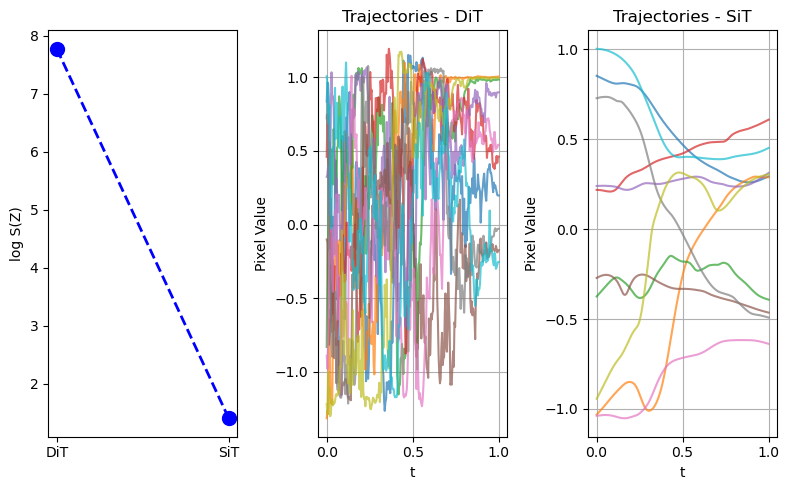

In [3]:
# Plot the straightening effect and trajectories
plot_straightness(pixel_data_dit, pixel_data_sit)

## This is in the VAE Latent, so we're not dealing with pixels here

C:\Users\tomma\AppData\Local\Temp\ipykernel_24564\3141493058.py:44: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
  S_Z, _ = np.log(quad(integrand, 0, 1))


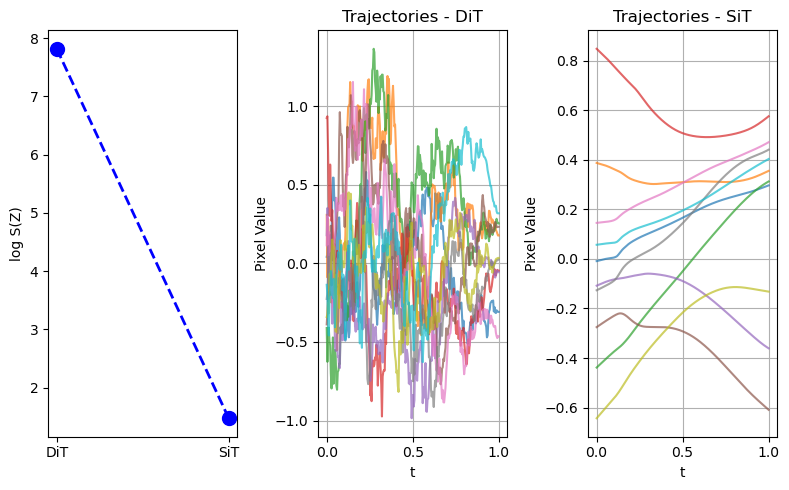

In [4]:
# Plot the straightening effect and trajectories
plot_straightness(latent_data_dit, latent_data_sit)

## DiT samples

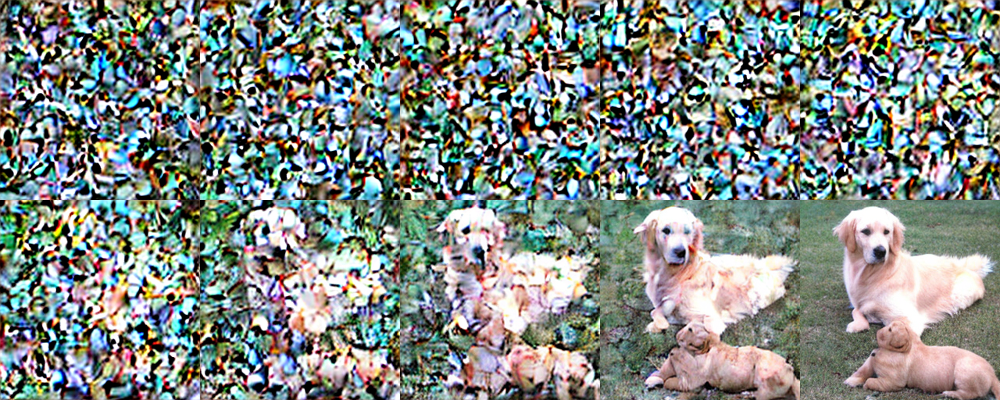

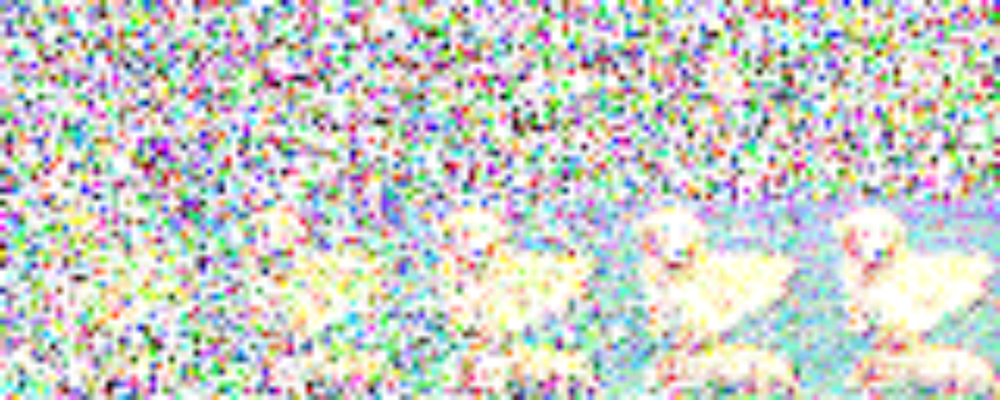

In [36]:
visualize(pixel_data_dit, latent_data_dit)

# SiT Samples

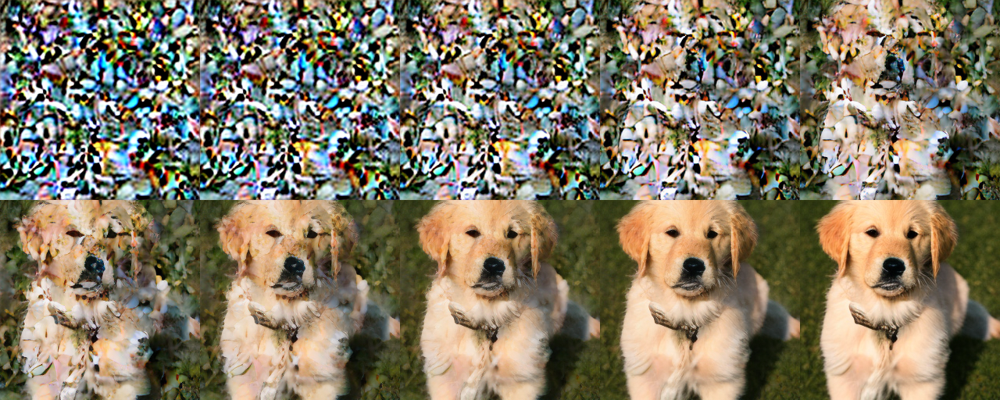

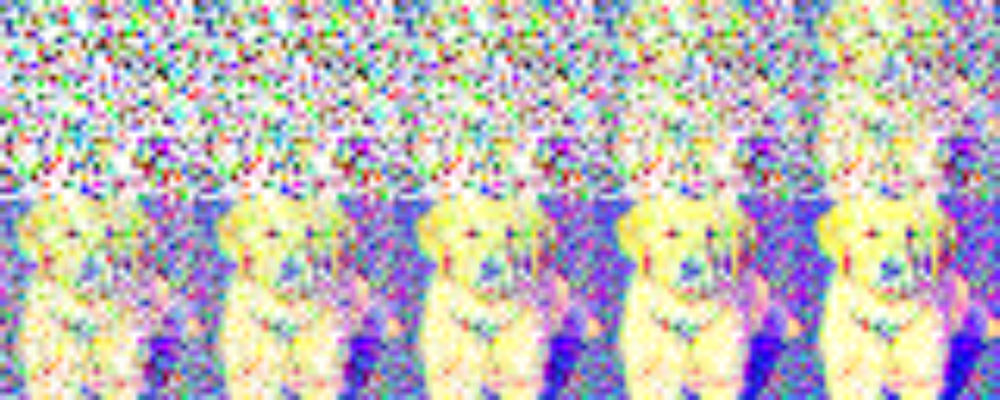

In [37]:
visualize(pixel_data_sit, latent_data_sit)

# With 32 steps

In [61]:
# load the data
pixel_data_dit = torch.load('dit_decoded_intermediate_samples_32.pt').cpu().numpy()
pixel_data_sit = torch.load('sit_decoded_intermediate_samples_32.pt').cpu().numpy()
latent_data_dit = torch.load('dit_intermediate_samples_32.pt').cpu().numpy()
latent_data_sit = torch.load('sit_intermediate_samples_32.pt').cpu().numpy()

C:\Users\tomma\AppData\Local\Temp\ipykernel_24564\3141493058.py:44: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
  S_Z, _ = np.log(quad(integrand, 0, 1))


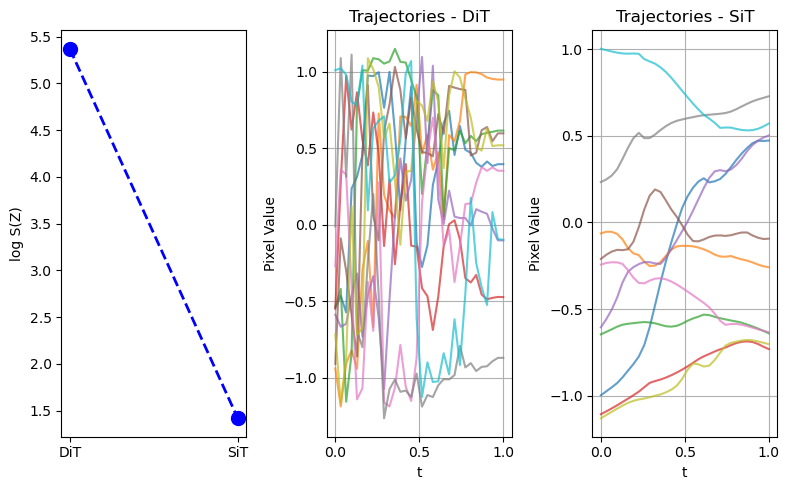

In [62]:
# Plot the straightening effect and trajectories
plot_straightness(pixel_data_dit, pixel_data_sit)

C:\Users\tomma\AppData\Local\Temp\ipykernel_24564\3141493058.py:44: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
  S_Z, _ = np.log(quad(integrand, 0, 1))


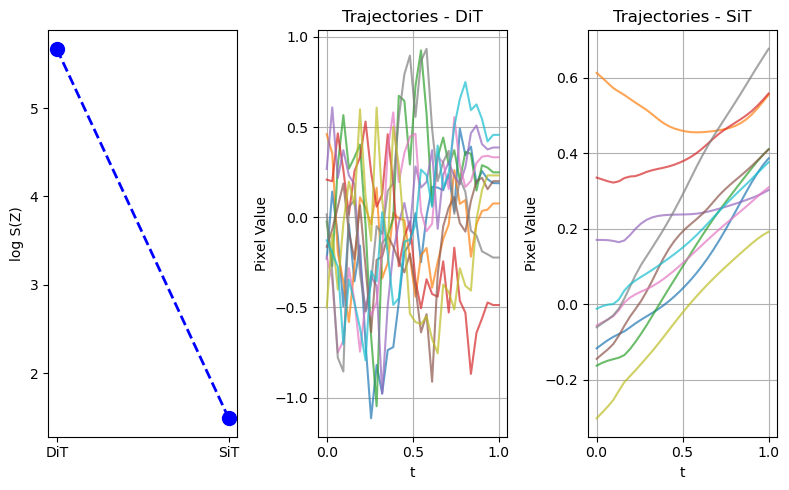

In [63]:
# Plot the straightening effect and trajectories
plot_straightness(latent_data_dit, latent_data_sit)

# DiT Samples

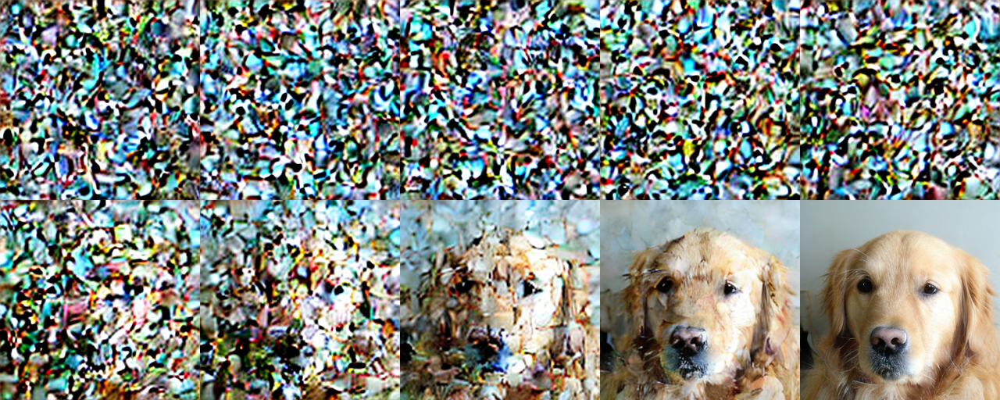

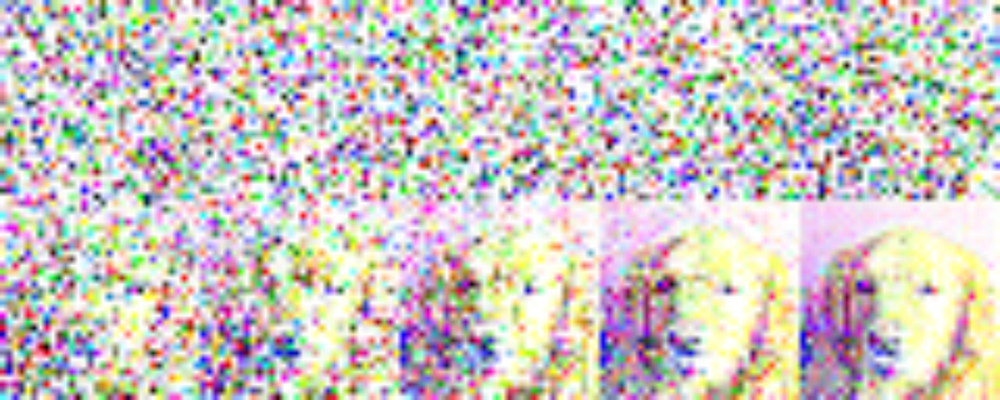

In [64]:
visualize(pixel_data_dit, latent_data_dit)

# SiT Samples

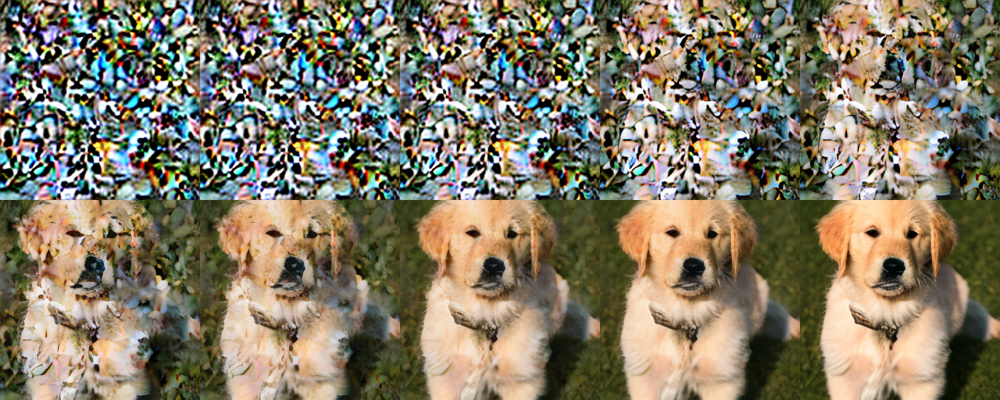

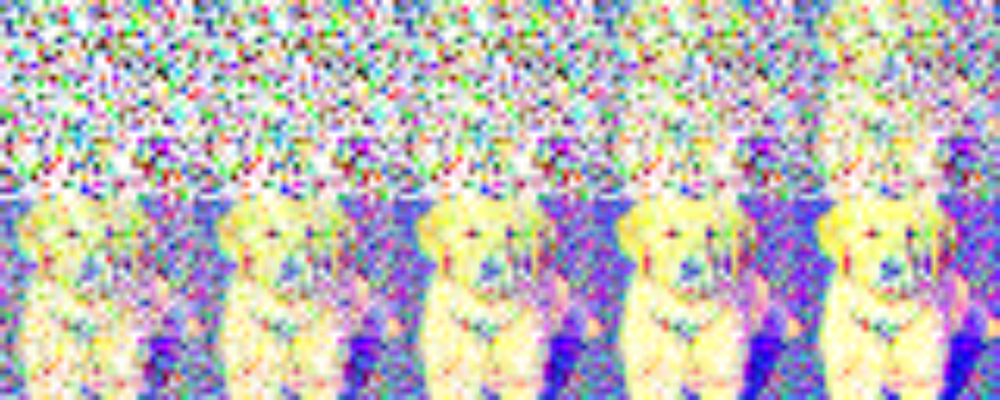

In [57]:
visualize(pixel_data_sit, latent_data_sit)

# Considerations

In the images above we see that the flows of both DiT and SiT are definitely more curved than the ones of Stable Diffusion and 2-Rectified Flow.
So the numeric results on the leftmost plot are consistent with the visualizations.

However, the DiT trajectories look particularly curvy. Could be because of the smaller training set compared to Stable Diffusion so less variety in images (?). Also, DiT and SiT are both class-conditioned on ImageNet classes so that might also contribute to this.  

With 32 steps, we see pretty much the same situations, messy trajectories for DiT and good-looking for SiT, in fact the generation is consistent with the 250-step one for SiT, while it's different (although still a dog cause of the class guidance) for DiT

Below, the image from the InstaFlow paper:  
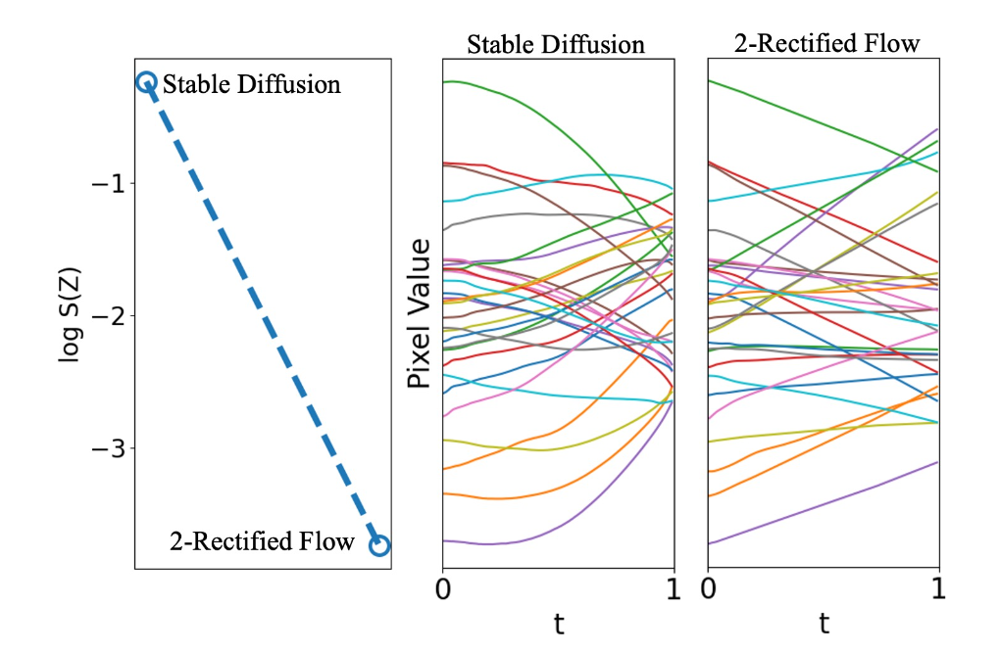